# Import Libraries

In [ ]:
#  Data manipulation
import pandas as pd
import numpy as np


#  Data visualization
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

from scipy.stats import ttest_ind, chi2_contingency, f_oneway
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.preprocessing import LabelEncoder


#Data Collection:

In [ ]:
file_path = "/content/Telco_customer_churn.xlsx"

# Since it's an Excel file, let's check the sheet names first
xls = pd.ExcelFile(file_path)
xls.sheet_names


['Telco_Churn']

In [ ]:
# Load the data from the specified sheet
df = pd.read_excel(xls, sheet_name="Telco_Churn")

# Display the column names
df.columns


Index(['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value',
       'Churn Score', 'CLTV', 'Churn Reason'],
      dtype='object')

In [ ]:
df.head()


,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


#Data Exploration (EDA)

In [ ]:
df_info = df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   int64  
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip Code           7043 non-null   int64  
 6   Lat Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure Months      7043 non-null   int64  
 14  Phone Service      7043 non-null   object 
 15  Multiple Lines     7043 non-null   object 
 16  Internet Service   7043 

In [ ]:
# checking for missing values
missing_values = df.isnull().sum()
print(missing_values)


#customer reasons have around 5200 missing values
#if we can use data augmentation on churn reason for generating more data


CustomerID              0
Count                   0
Country                 0
State                   0
City                    0
Zip Code                0
Lat Long                0
Latitude                0
Longitude               0
Gender                  0
Senior Citizen          0
Partner                 0
Dependents              0
Tenure Months           0
Phone Service           0
Multiple Lines          0
Internet Service        0
Online Security         0
Online Backup           0
Device Protection       0
Tech Support            0
Streaming TV            0
Streaming Movies        0
Contract                0
Paperless Billing       0
Payment Method          0
Monthly Charges         0
Total Charges           0
Churn Label             0
Churn Value             0
Churn Score             0
CLTV                    0
Churn Reason         5174
dtype: int64


In [ ]:
# checking for duplicate rows
duplicate_count = df.duplicated().sum()
print(duplicate_count)


0


In [ ]:
# Summary statistics of numerical columns
summary_stats = df.describe()
print(summary_stats)


        Count      Zip Code     Latitude    Longitude  Tenure Months  \
count  7043.0   7043.000000  7043.000000  7043.000000    7043.000000   
mean      1.0  93521.964646    36.282441  -119.798880      32.371149   
std       0.0   1865.794555     2.455723     2.157889      24.559481   
min       1.0  90001.000000    32.555828  -124.301372       0.000000   
25%       1.0  92102.000000    34.030915  -121.815412       9.000000   
50%       1.0  93552.000000    36.391777  -119.730885      29.000000   
75%       1.0  95351.000000    38.224869  -118.043237      55.000000   
max       1.0  96161.000000    41.962127  -114.192901      72.000000   

       Monthly Charges  Churn Value  Churn Score         CLTV  
count      7043.000000  7043.000000  7043.000000  7043.000000  
mean         64.761692     0.265370    58.699418  4400.295755  
std          30.090047     0.441561    21.525131  1183.057152  
min          18.250000     0.000000     5.000000  2003.000000  
25%          35.500000     0.00

In [ ]:
 # Check if categories are consistent
 df["Payment Method"].unique()

array(['Mailed check', 'Electronic check', 'Bank transfer (automatic)',
       'Credit card (automatic)'], dtype=object)

# Milestone 1: Data Exploration and Preprocessing

# Data Exploration (EDA)
1. Dataset Size: 7,043 rows × 33 columns
2. Missing Values:
The "Churn Reason" column has 5,174 missing values. This is expected since only churned customers have a recorded reason.
All other columns have no missing values.
3. Duplicates: No duplicate rows found.
4. Data Types:
"Total Charges" is stored as an object instead of a numerical type.
Most categorical variables are stored as objects and will need encoding.
5. Key Numeric Stats:
Tenure Months: Ranges from 0 to 72 months, with a median of 29 months.
Monthly Charges: Ranges from $18.25 to $118.75, with a mean of $64.76.
Churn Rate: 26.5% (1,869 churned customers out of 7,043).

In [ ]:
# Convert 'Total Charges' to numeric, forcing errors='coerce' to handle empty strings
df["Total Charges"] = pd.to_numeric(df["Total Charges"], errors='coerce')


#In the pd.to_numeric() function, setting errors='coerce' means that if there are any invalid values (such as empty strings, spaces, or non-numeric characters), they will be converted to NaN (Not a Number) instead of causing an error.

In [ ]:
df["Total Charges"] = df["Total Charges"].fillna(0)

In [ ]:
df = pd.get_dummies(df, columns=["Internet Service"], drop_first=True)


In [ ]:
encoder = LabelEncoder()
df["Contract"] = encoder.fit_transform(df["Contract"])

<Figure size 1500x500 with 0 Axes>

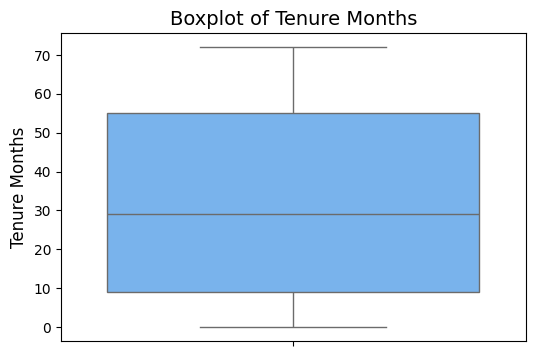

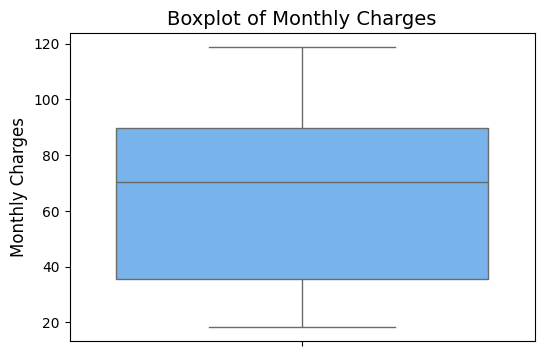

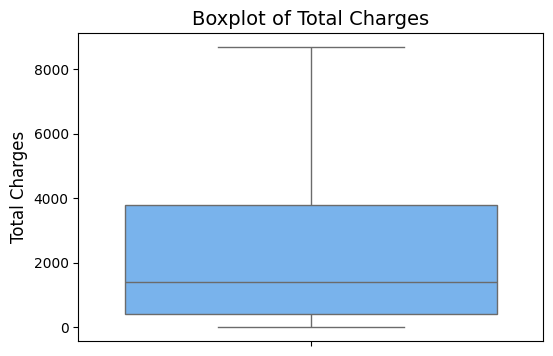

In [ ]:
# Visualizing outliers using boxplots for each numerical column
numerical_columns = ["Tenure Months", "Monthly Charges", "Total Charges"]

plt.figure(figsize=(15,5))

for i, col in enumerate(numerical_columns):
    plt.figure(figsize=(6,4))
    sns.boxplot(y=df[col], color="#66b3ff")
    plt.title(f"Boxplot of {col}", fontsize=14)
    plt.ylabel(col, fontsize=12)
    plt.show()


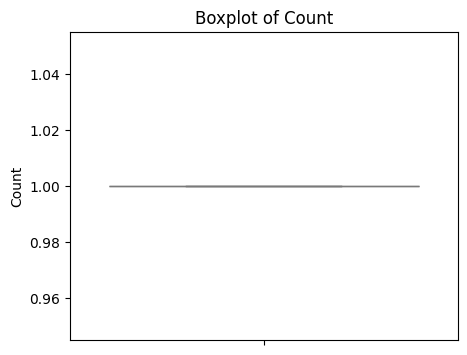

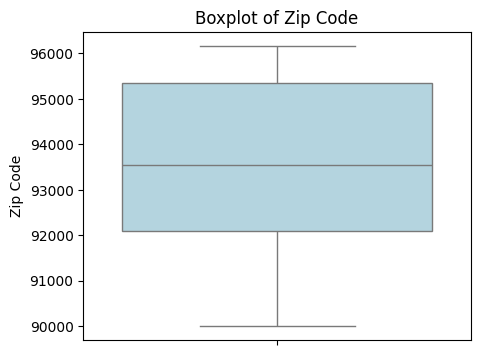

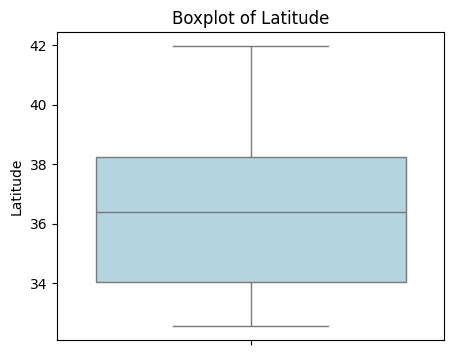

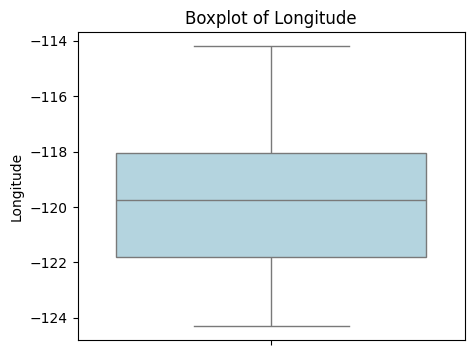

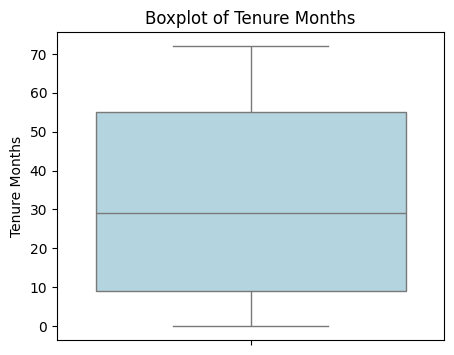

...

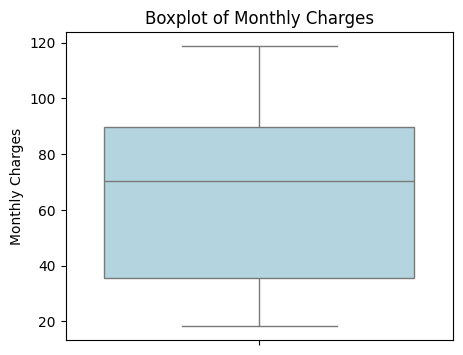

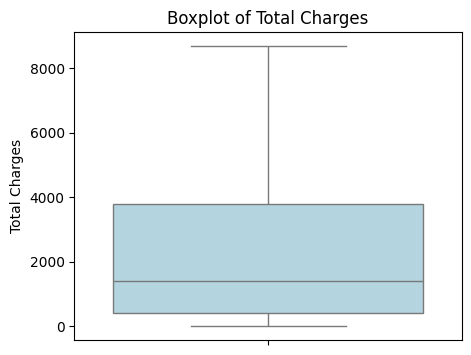

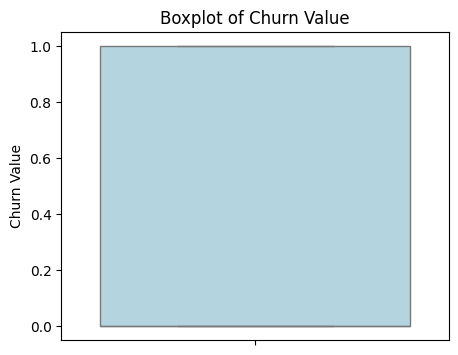

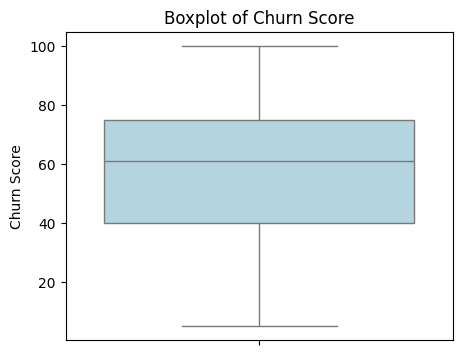

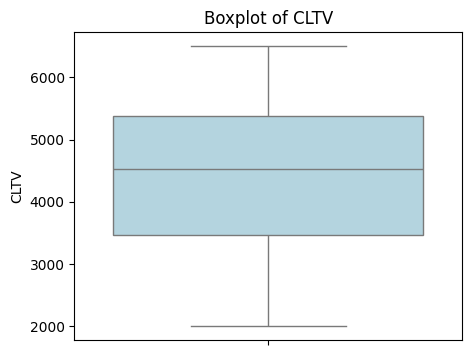

Outliers removed based on boxplots.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

bbox = {'boxstyle': 'round', 'facecolor': '#ffffff', 'linewidth': 0.3, 'pad': 0.15}

# Select numerical columns
numerical_columns = df.select_dtypes(include=['number']).columns

#  Boxplots for Outlier Detection
for col in numerical_columns:
    fig, ax = plt.subplots(figsize=(5, 4))
    sns.boxplot(y=df[col], color='lightblue', ax=ax)
    ax.set_title(f'Boxplot of {col}')
    plt.show()

#  Remove Outliers using IQR
def remove_outliers(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

# Apply outlier removal
for col in numerical_columns:
    df = remove_outliers(df, col)

print("Outliers removed based on boxplots.")


In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Directory to save images
output_dir = "boxplots"
os.makedirs(output_dir, exist_ok=True)

bbox = {'boxstyle': 'round', 'facecolor': '#ffffff', 'linewidth': 0.3, 'pad': 0.15}

# Select numerical columns
numerical_columns = df.select_dtypes(include=['number']).columns

# Generate and save boxplots
for col in numerical_columns:
    fig, ax = plt.subplots(figsize=(5, 4))
    sns.boxplot(y=df[col], color='lightblue', ax=ax)
    ax.set_title(f'Boxplot of {col}')

    # Save the plot
    filename = os.path.join(output_dir, f"{col}_boxplot.png")
    plt.savefig(filename, bbox_inches='tight')
    plt.close(fig)

print(f"Boxplots saved in the '{output_dir}' directory.")


Boxplots saved in the 'boxplots' directory.


<ipython-input-18-004f186a6315>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df["Churn Value"], palette=["#ff9999", "#66b3ff"])


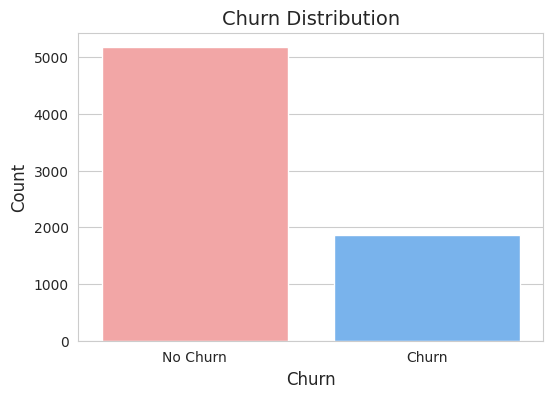

<ipython-input-18-004f186a6315>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df["Churn Value"], y=df["Tenure Months"], palette=["#ff9999", "#66b3ff"])


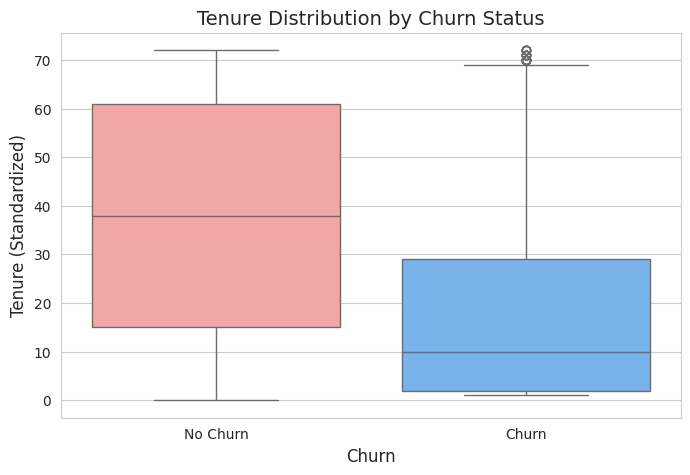

<ipython-input-18-004f186a6315>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df["Churn Value"], y=df["Monthly Charges"], palette=["#ff9999", "#66b3ff"])


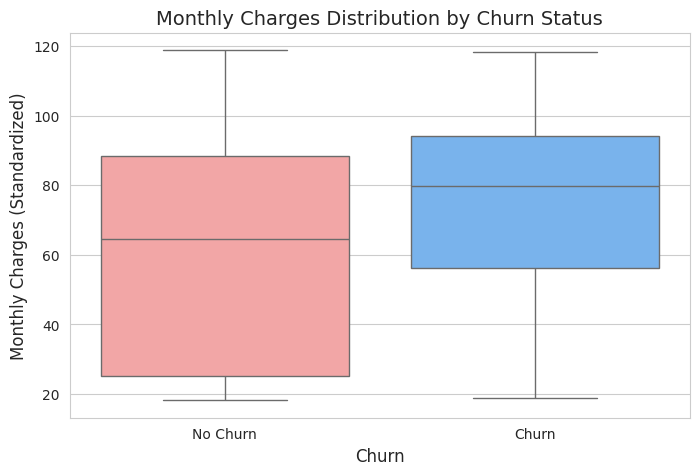

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the visual style
sns.set_style("whitegrid")

# Churn distribution
plt.figure(figsize=(6,4))
sns.countplot(x=df["Churn Value"], palette=["#ff9999", "#66b3ff"])
plt.xticks(ticks=[0,1], labels=["No Churn", "Churn"])
plt.title("Churn Distribution", fontsize=14)
plt.xlabel("Churn", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.show()

# Boxplot of Tenure vs Churn
plt.figure(figsize=(8,5))
sns.boxplot(x=df["Churn Value"], y=df["Tenure Months"], palette=["#ff9999", "#66b3ff"])
plt.xticks(ticks=[0,1], labels=["No Churn", "Churn"])
plt.title("Tenure Distribution by Churn Status", fontsize=14)
plt.xlabel("Churn", fontsize=12)
plt.ylabel("Tenure (Standardized)", fontsize=12)
plt.show()

# Monthly Charges vs Churn
plt.figure(figsize=(8,5))
sns.boxplot(x=df["Churn Value"], y=df["Monthly Charges"], palette=["#ff9999", "#66b3ff"])
plt.xticks(ticks=[0,1], labels=["No Churn", "Churn"])
plt.title("Monthly Charges Distribution by Churn Status", fontsize=14)
plt.xlabel("Churn", fontsize=12)
plt.ylabel("Monthly Charges (Standardized)", fontsize=12)
plt.show()

<ipython-input-19-bbb4c739f365>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Churn Label', palette=palette, ax=ax)


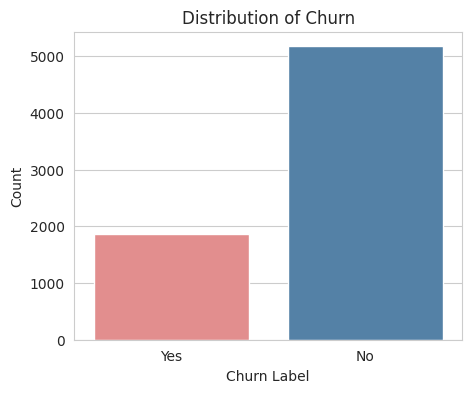

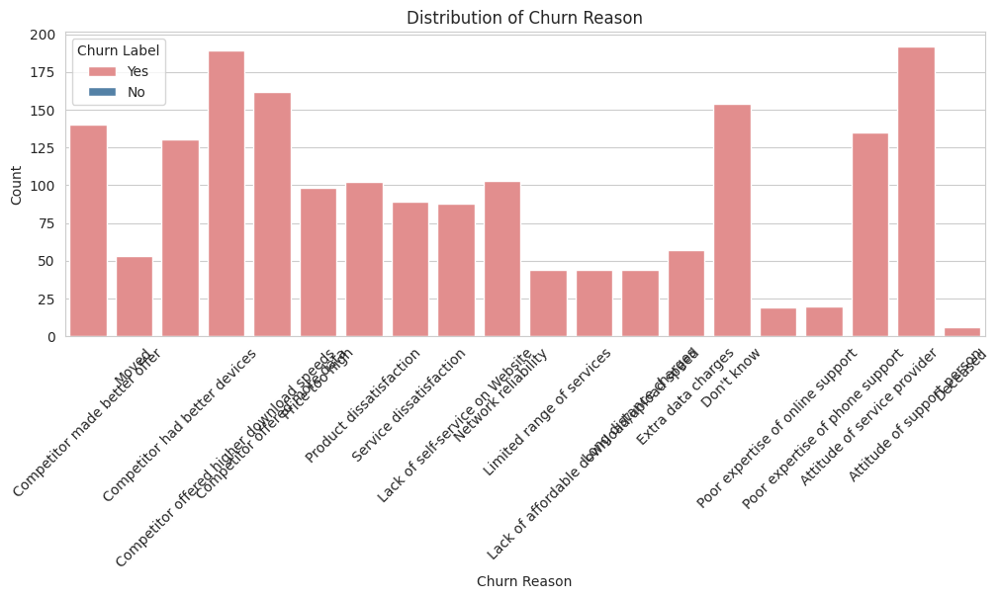

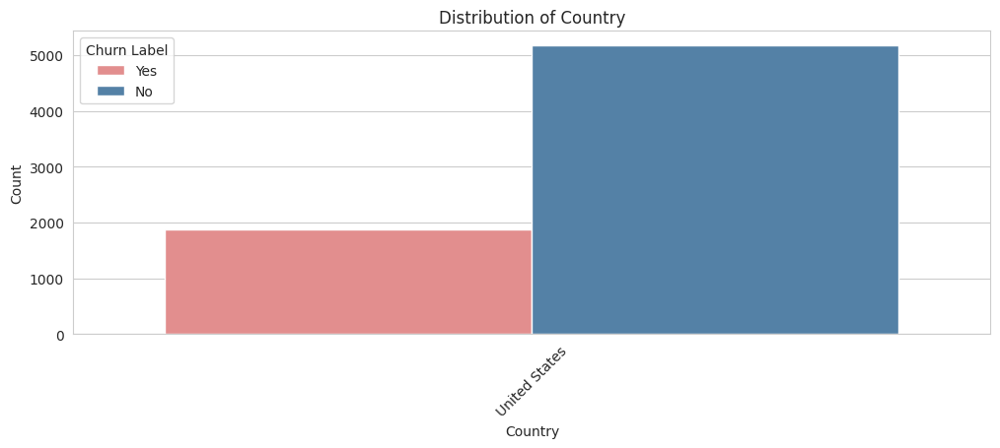

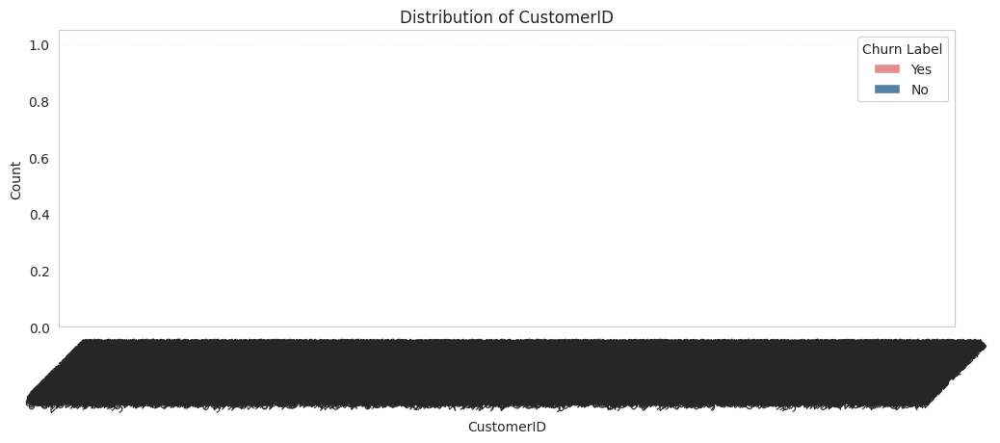

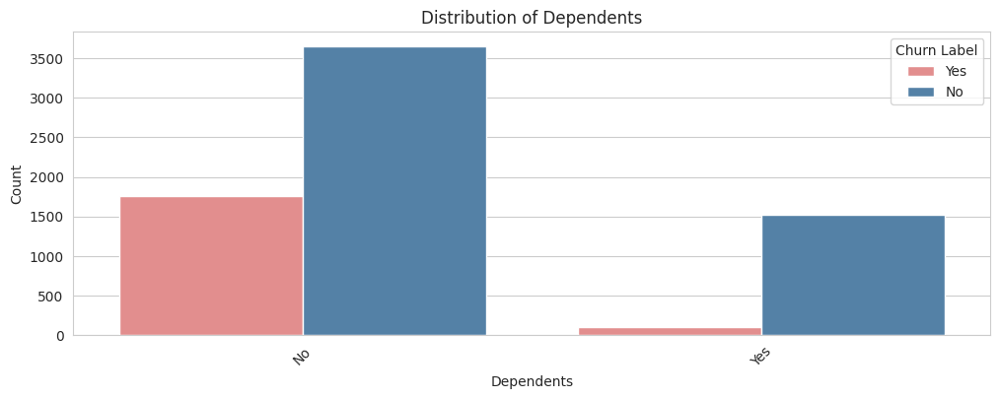

...

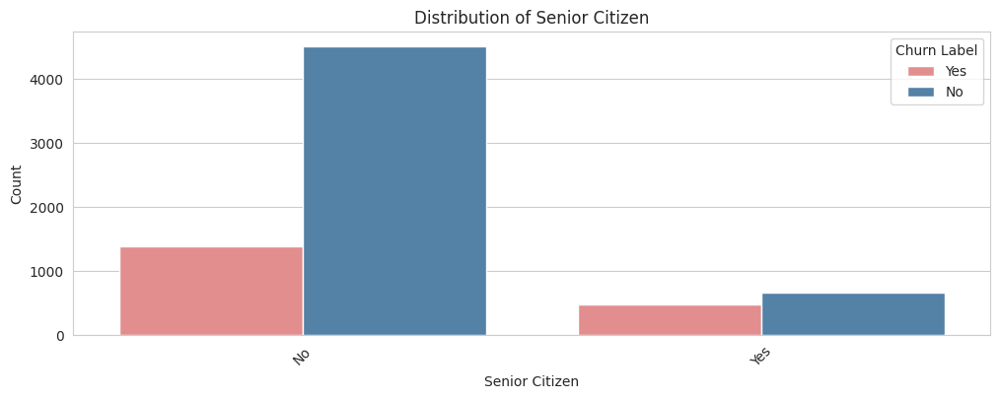

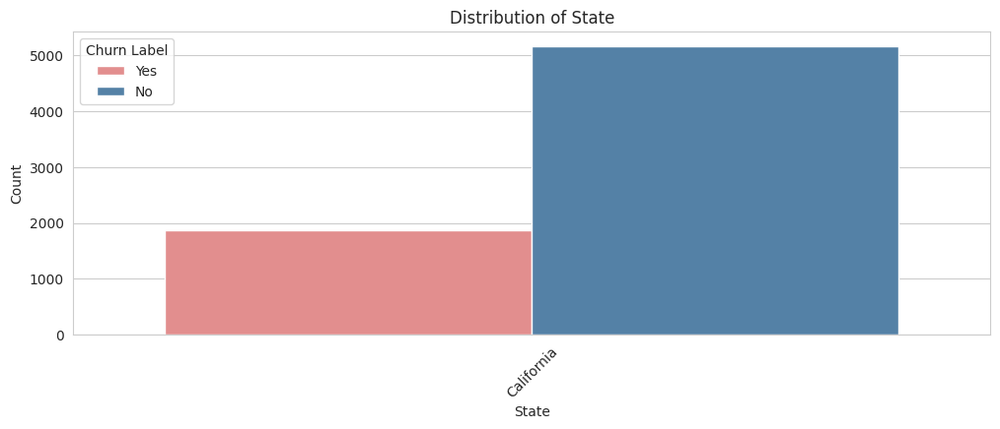

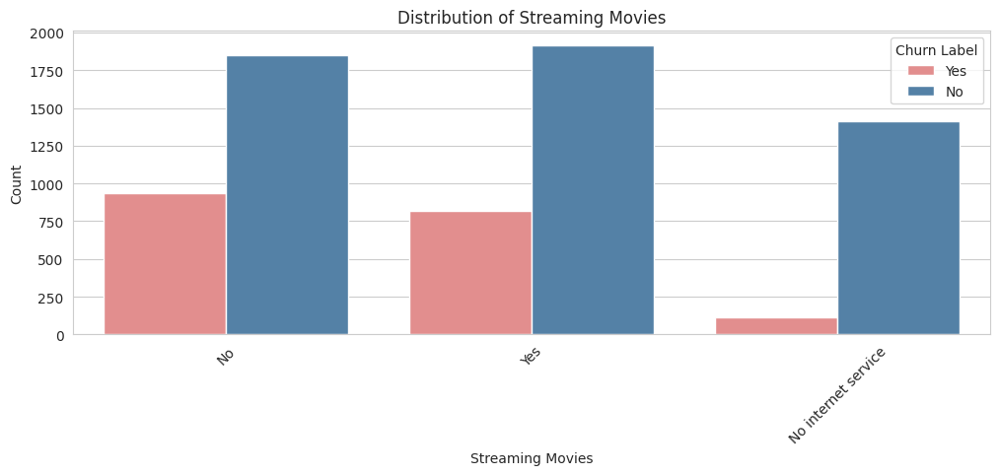

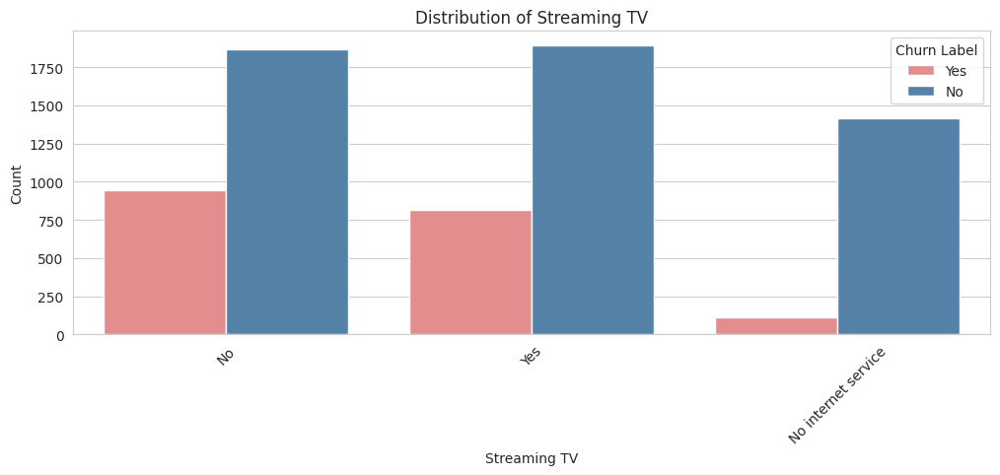

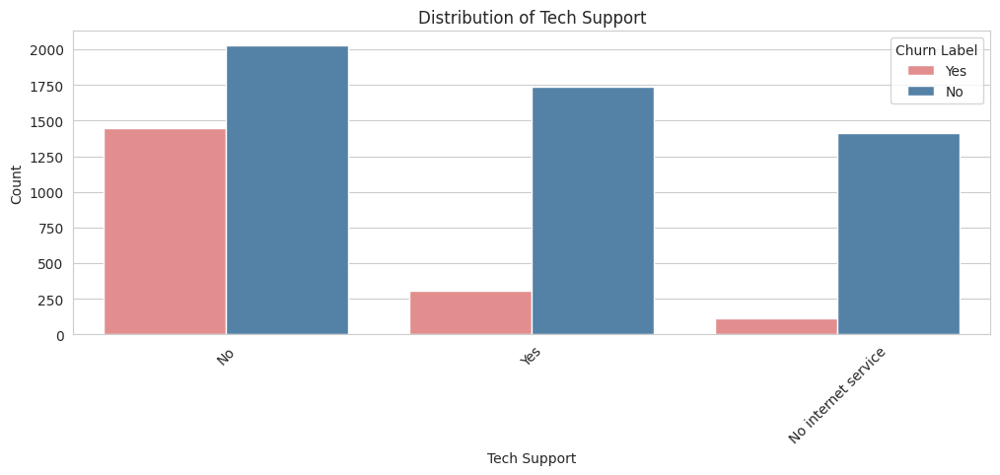

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convert 'Churn Label' to string for consistency
df['Churn Label'] = df['Churn Label'].astype(str)
palette = {'Yes': 'lightcoral', 'No': 'steelblue'}

# Churn Distribution Bar Chart
fig, ax = plt.subplots(figsize=(5, 4))
sns.countplot(data=df, x='Churn Label', palette=palette, ax=ax)
ax.set_title('Distribution of Churn')
ax.set_ylabel('Count')

plt.show()


# Function to plot categorical column distributions
def plot_categorical_column(df, col, figsize=(12, 4)):
    fig, ax = plt.subplots(figsize=figsize)

    # Countplot for category distribution
    sns.countplot(data=df, x=col, hue='Churn Label', palette=palette, ax=ax)
    ax.set_title(f'Distribution of {col}')
    ax.set_ylabel('Count')

    plt.xticks(rotation=45)
    plt.show()


# Plot for all categorical columns except 'City' and 'Churn Label'
categorical_cols = df.select_dtypes(include=['object']).columns.difference(['City', 'Churn Label'])
for col in categorical_cols:
    plot_categorical_column(df, col)

2. Data Preprocessing
Convert "Total Charges" to a numeric format.
Drop unnecessary columns like "CustomerID", "Count", "Country", "Lat Long" (not useful for churn prediction).
Encode categorical variables (one-hot encoding or label encoding).
Normalize numerical features like "Monthly Charges" and "Tenure Months".

------------------------------------------------------

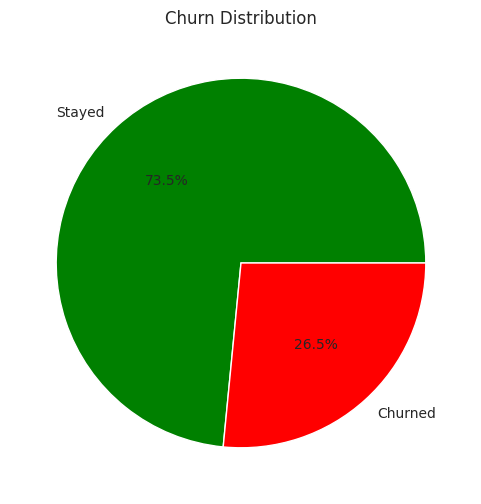

In [ ]:
# churn value
churn_counts = df['Churn Value'].value_counts()
plt.figure(figsize=(6, 6))
plt.pie(churn_counts, labels=['Stayed', 'Churned'], autopct='%1.1f%%', colors=['green', 'red'])
plt.title("Churn Distribution")
plt.show()

# 26.5% of customers churned

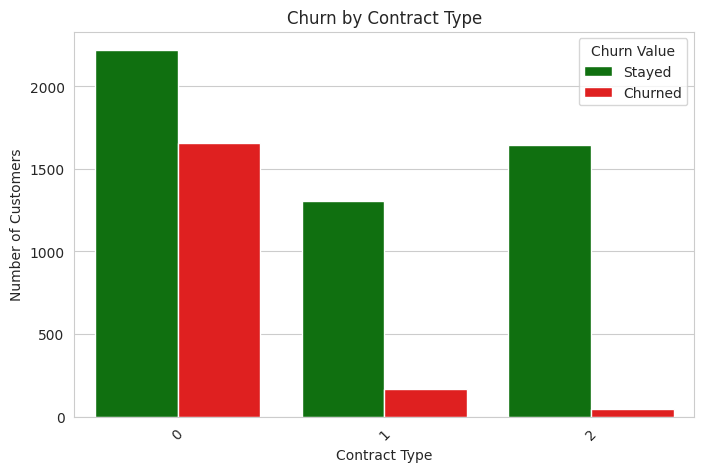

In [ ]:

plt.figure(figsize=(8, 5))
sns.countplot(x='Contract', hue='Churn Value', data=df, palette={0: "green", 1: "red"})
plt.title("Churn by Contract Type")
plt.xlabel("Contract Type")
plt.ylabel("Number of Customers")
plt.legend(title="Churn Value", labels=["Stayed", "Churned"])
plt.xticks(rotation=45)
plt.show()

# Most customers who churned they have contract less than year

In [ ]:
df[df["Churn Value"] == 0]["Churn Reason"].value_counts()

,count
Churn Reason,


In [ ]:
df[df["Churn Value"] == 1]["Churn Reason"].value_counts().sum()

1869

In [ ]:
df[df["Churn Value"] == 1].value_counts().sum()

1869

#we have reason for all customers who leaved, so we can predict the reason if the customer churn score is high or when he decided to leave ,then we can solve his problem




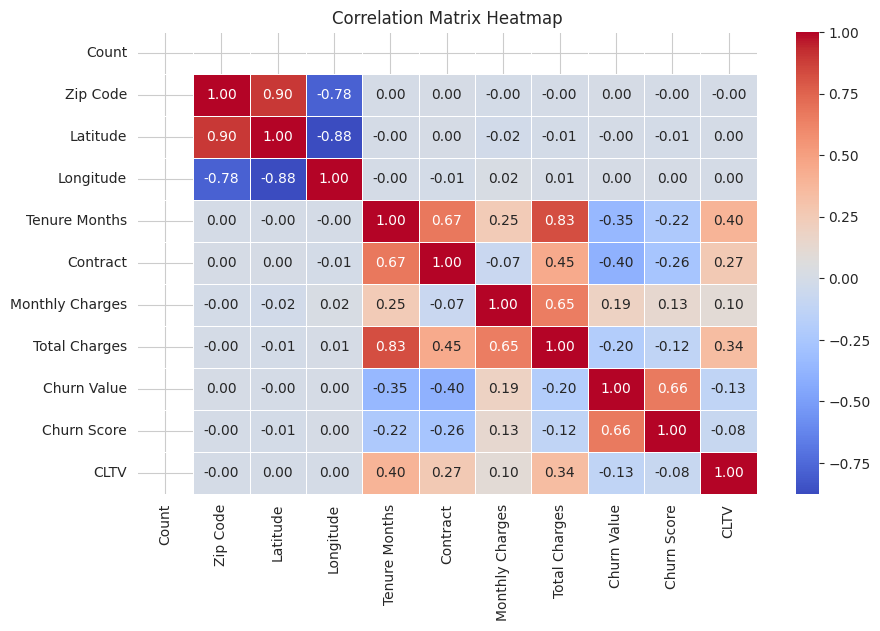

In [ ]:
# Compute the correlation matrix
corr_matrix = df.select_dtypes(include=['number']).corr()

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")
plt.show()

In [ ]:
churn_col = 'Churn Value'
# T-test: Numerical Features vs. Churn
numerical_features = df.select_dtypes(include=['float', 'int']).columns

for col in numerical_features:
    if col != churn_col:
        group1 = df[df[churn_col] == 0][col]
        group2 = df[df[churn_col] == 1][col]
        t_stat, p_value = ttest_ind(group1, group2, equal_var=False)
        print(f"T-test for {col}: p-value = {p_value:.5f}")

T-test for Count: p-value = nan
T-test for Zip Code: p-value = 0.77836
T-test for Latitude: p-value = 0.77745
T-test for Longitude: p-value = 0.70033
T-test for Tenure Months: p-value = 0.00000
T-test for Contract: p-value = 0.00000
T-test for Monthly Charges: p-value = 0.00000
T-test for Total Charges: p-value = 0.00000
T-test for Churn Score: p-value = 0.00000
T-test for CLTV: p-value = 0.00000


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


# This columns have strong relation to churn
Tenure Months
Contract
Monthly Charges
Total Charges
Churn Score                                        
CLTV (Customer Lifetime Value)

In [ ]:
#ANOVA:
anova_features = ['Churn Value', 'Churn Score']

for col in anova_features:
    groups = [df[df[churn_col] == cat][col] for cat in df[churn_col].unique()]
    f_stat, p_value = f_oneway(*groups)
    print(f"ANOVA for {col}: p-value = {p_value:.5f}")


ANOVA for Churn Value: p-value = 0.00000
ANOVA for Churn Score: p-value = 0.00000


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: ConstantInputWarning: Each of the input arrays is constant; the F statistic is not defined or infinite
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
# Chi Square test
categorical_features = df.select_dtypes(include=['object', 'category',"bool"]).columns

for col in categorical_features:
    if col != churn_col:
        contingency_table = pd.crosstab(df[col], df[churn_col])
        chi2, p_value, _, _ = chi2_contingency(contingency_table)
        print(f"Chi-Square Test for {col}: p-value = {p_value:.5f}")

Chi-Square Test for CustomerID: p-value = 0.49440
Chi-Square Test for Country: p-value = 1.00000
Chi-Square Test for State: p-value = 1.00000
Chi-Square Test for City: p-value = 0.01498
Chi-Square Test for Lat Long: p-value = 0.05118
Chi-Square Test for Gender: p-value = 0.48658
Chi-Square Test for Senior Citizen: p-value = 0.00000
Chi-Square Test for Partner: p-value = 0.00000
Chi-Square Test for Dependents: p-value = 0.00000
Chi-Square Test for Phone Service: p-value = 0.33878
Chi-Square Test for Multiple Lines: p-value = 0.00346
Chi-Square Test for Online Security: p-value = 0.00000
Chi-Square Test for Online Backup: p-value = 0.00000
Chi-Square Test for Device Protection: p-value = 0.00000
Chi-Square Test for Tech Support: p-value = 0.00000
Chi-Square Test for Streaming TV: p-value = 0.00000
Chi-Square Test for Streaming Movies: p-value = 0.00000
Chi-Square Test for Paperless Billing: p-value = 0.00000
Chi-Square Test for Payment Method: p-value = 0.00000
Chi-Square Test for Churn 

# This categorical columns have strong relation to churn

*   City
*   Senior Citizen
*   Partner
*   Dependents
*   Multiple Line
*   Online Security
*   Online Backup
*   Device Protection
*   Tech Support
*   Streaming TV
*   Streaming Movies
*   Paperless Billing
*   Payment Method
*   Churn Label
*   Internet Service_Fiber optic
*   Internet Service_No









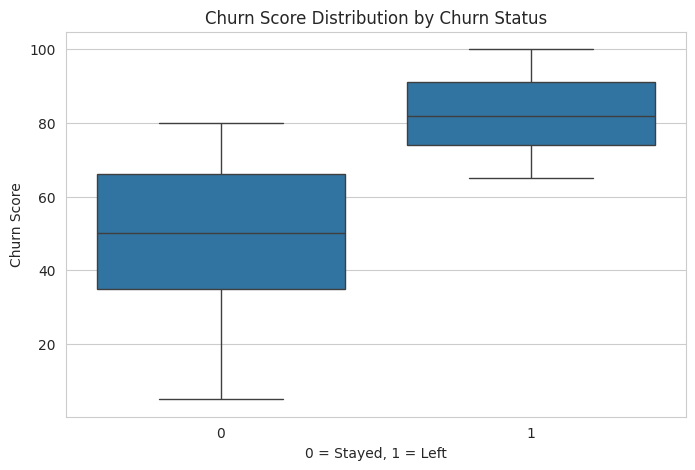

In [ ]:
# plotting relation between churn score and churn status
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['Churn Value'], y=df['Churn Score'])
plt.title("Churn Score Distribution by Churn Status")
plt.xlabel("0 = Stayed, 1 = Left")
plt.ylabel("Churn Score")
plt.show()


In [ ]:
# get the best threshold using Youden's J statistic

y_true = df['Churn Value']
y_scores = df['Churn Score']

fpr, tpr, thresholds = roc_curve(y_true, y_scores)

best_idx = (tpr - fpr).argmax()
best_threshold = thresholds[best_idx]

print(f"Best churn score threshold is  {best_threshold}")


Best churn score threshold is  65.0


In [ ]:
# Create a predicted churn column based on the best threshold
df['Predicted_Churn'] = (df['Churn Score'] >= best_threshold).astype(int)
accuracy = accuracy_score(df['Churn Value'], df['Predicted_Churn'])
print(f"Model Accuracy: {accuracy:.2f}")


Model Accuracy: 0.80


so we shouldn't let customer churn score become more than 65%,
 because most of customers who's score increared more than 65 they left

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 35 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   CustomerID                    7043 non-null   object 
 1   Count                         7043 non-null   int64  
 2   Country                       7043 non-null   object 
 3   State                         7043 non-null   object 
 4   City                          7043 non-null   object 
 5   Zip Code                      7043 non-null   int64  
 6   Lat Long                      7043 non-null   object 
 7   Latitude                      7043 non-null   float64
 8   Longitude                     7043 non-null   float64
 9   Gender                        7043 non-null   object 
 10  Senior Citizen                7043 non-null   object 
 11  Partner                       7043 non-null   object 
 12  Dependents                    7043 non-null   object 
 13  Ten

In [ ]:
pip install folium


In [ ]:
import folium
from folium.plugins import MarkerCluster

# Create a base map centered at the mean location
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=6)

# Add marker clusters (groups markers for better visibility)
marker_cluster = MarkerCluster().add_to(m)

# Add points to the map
for _, row in df.iterrows():
    color = "red" if row['Churn Value'] == 1 else "green"
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Churn Value: {row['Churn Value']}",
        icon=folium.Icon(color=color)
    ).add_to(marker_cluster)

# Showing map
m


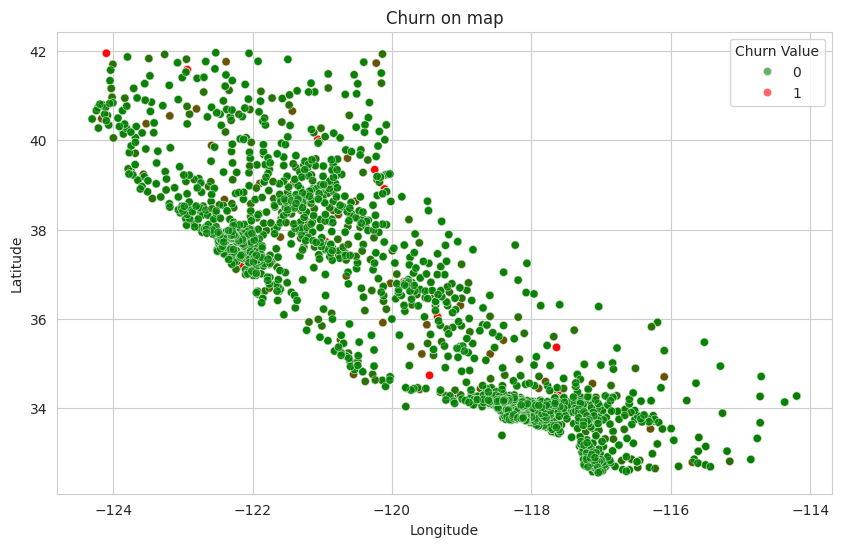

In [ ]:
# Create scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df["Longitude"],
    y=df["Latitude"],
    hue=df["Churn Value"],
    palette={0: "green", 1: "red"},
    alpha=0.6
)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Churn on map")
plt.show()


# Depend on the map and correlation matrix , customer churn isn't depend on location

In [ ]:
df.columns


Index(['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Online Security', 'Online Backup',
       'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies',
       'Contract', 'Paperless Billing', 'Payment Method', 'Monthly Charges',
       'Total Charges', 'Churn Label', 'Churn Value', 'Churn Score', 'CLTV',
       'Churn Reason', 'Internet Service_Fiber optic', 'Internet Service_No',
       'Predicted_Churn'],
      dtype='object')

In [ ]:
df['Churn Value'],df['Churn Label']

(0       1
 1       1
 2       1
 3       1
 4       1
        ..
 7038    0
 7039    0
 7040    0
 7041    0
 7042    0
 Name: Churn Value, Length: 7043, dtype: int64,
 0       Yes
 1       Yes
 2       Yes
 3       Yes
 4       Yes
        ... 
 7038     No
 7039     No
 7040     No
 7041     No
 7042     No
 Name: Churn Label, Length: 7043, dtype: object)

In [ ]:
#Drop unnecessary columns
modified_df=df.drop(columns=['CustomerID', 'Count', 'Country', 'State', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Phone Service', 'Churn Label',
       'Predicted_Churn'
        ])

In [ ]:
modified_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 23 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   City                          7043 non-null   object 
 1   Senior Citizen                7043 non-null   object 
 2   Partner                       7043 non-null   object 
 3   Dependents                    7043 non-null   object 
 4   Tenure Months                 7043 non-null   int64  
 5   Multiple Lines                7043 non-null   object 
 6   Online Security               7043 non-null   object 
 7   Online Backup                 7043 non-null   object 
 8   Device Protection             7043 non-null   object 
 9   Tech Support                  7043 non-null   object 
 10  Streaming TV                  7043 non-null   object 
 11  Streaming Movies              7043 non-null   object 
 12  Contract                      7043 non-null   int64  
 13  Pap

In [ ]:
modified_df.select_dtypes(include=['object', 'category']).nunique()

,0
City,1129
Senior Citizen,2
Partner,2
Dependents,2
Multiple Lines,3
Online Security,3
Online Backup,3
Device Protection,3
Tech Support,3
Streaming TV,3


In [ ]:
df["City"].value_counts()

,count
City,
Los Angeles,305
San Diego,150
San Jose,112
Sacramento,108
San Francisco,104
...,...
Healdsburg,4
Jenner,4
Philo,4


In [ ]:
numerical_columns=modified_df.select_dtypes(include=["int","float"]).columns
modified_df[numerical_columns]

,Tenure Months,Contract,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV
0,2,0,53.85,108.15,1,86,3239
1,2,0,70.70,151.65,1,67,2701
2,8,0,99.65,820.50,1,86,5372
3,28,0,104.80,3046.05,1,84,5003
4,49,0,103.70,5036.30,1,89,5340
...,...,...,...,...,...,...,...
7038,72,2,21.15,1419.40,0,45,5306
7039,24,1,84.80,1990.50,0,59,2140
7040,72,1,103.20,7362.90,0,71,5560
7041,11,0,29.60,346.45,0,59,2793


In [ ]:
churned_df=modified_df[modified_df["Churn Value"]==1]

In [ ]:
modified_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 23 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   City                          7043 non-null   object 
 1   Senior Citizen                7043 non-null   object 
 2   Partner                       7043 non-null   object 
 3   Dependents                    7043 non-null   object 
 4   Tenure Months                 7043 non-null   int64  
 5   Multiple Lines                7043 non-null   object 
 6   Online Security               7043 non-null   object 
 7   Online Backup                 7043 non-null   object 
 8   Device Protection             7043 non-null   object 
 9   Tech Support                  7043 non-null   object 
 10  Streaming TV                  7043 non-null   object 
 11  Streaming Movies              7043 non-null   object 
 12  Contract                      7043 non-null   int64  
 13  Pap

In [ ]:
#label encoder on categorical column
categorical_cols = modified_df.select_dtypes(include=['object', 'category','bool']).columns

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    modified_df[col] = le.fit_transform(modified_df[col])
    label_encoders[col] = le

modified_df.head()

,City,Senior Citizen,Partner,Dependents,Tenure Months,Multiple Lines,Online Security,Online Backup,Device Protection,Tech Support,...,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV,Churn Reason,Internet Service_Fiber optic,Internet Service_No
0,562,0,0,0,2,0,2,2,0,0,...,1,3,53.85,108.15,1,86,3239,3,0,0
1,562,0,0,1,2,0,0,0,0,0,...,1,2,70.70,151.65,1,67,2701,13,1,0
2,562,0,0,1,8,2,0,0,2,0,...,1,2,99.65,820.50,1,86,5372,13,1,0
3,562,0,1,1,28,2,0,0,2,2,...,1,2,104.80,3046.05,1,84,5003,13,1,0
4,562,0,0,1,49,2,0,2,2,0,...,1,0,103.70,5036.30,1,89,5340,2,1,0


In [ ]:
#pip install imbalanced-learn

In [ ]:
from imblearn.over_sampling import SMOTE
x = modified_df.drop('Churn Value',axis=1)
y = modified_df['Churn Value']
X_resampled , y_resampled  = SMOTE(random_state = 42).fit_resample(x,y)

In [ ]:
modified_df_1 = pd.DataFrame(X_resampled, columns=x.columns)
modified_df_1['Churn Value'] = y_resampled

print(modified_df_1['Churn Value'].value_counts())

Churn Value
1    5174
0    5174
Name: count, dtype: int64


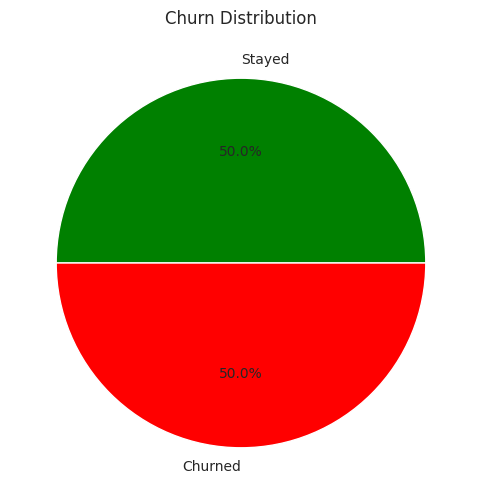

In [ ]:
churn_count = modified_df_1['Churn Value'].value_counts()
plt.figure(figsize=(6, 6))
plt.pie(churn_count, labels=['Stayed', 'Churned'], autopct='%1.1f%%', colors=['green', 'red'])
plt.title("Churn Distribution")
plt.show()

In [ ]:
modified_df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10348 entries, 0 to 10347
Data columns (total 23 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   City                          10348 non-null  int64  
 1   Senior Citizen                10348 non-null  int64  
 2   Partner                       10348 non-null  int64  
 3   Dependents                    10348 non-null  int64  
 4   Tenure Months                 10348 non-null  int64  
 5   Multiple Lines                10348 non-null  int64  
 6   Online Security               10348 non-null  int64  
 7   Online Backup                 10348 non-null  int64  
 8   Device Protection             10348 non-null  int64  
 9   Tech Support                  10348 non-null  int64  
 10  Streaming TV                  10348 non-null  int64  
 11  Streaming Movies              10348 non-null  int64  
 12  Contract                      10348 non-null  int64  
 13  P

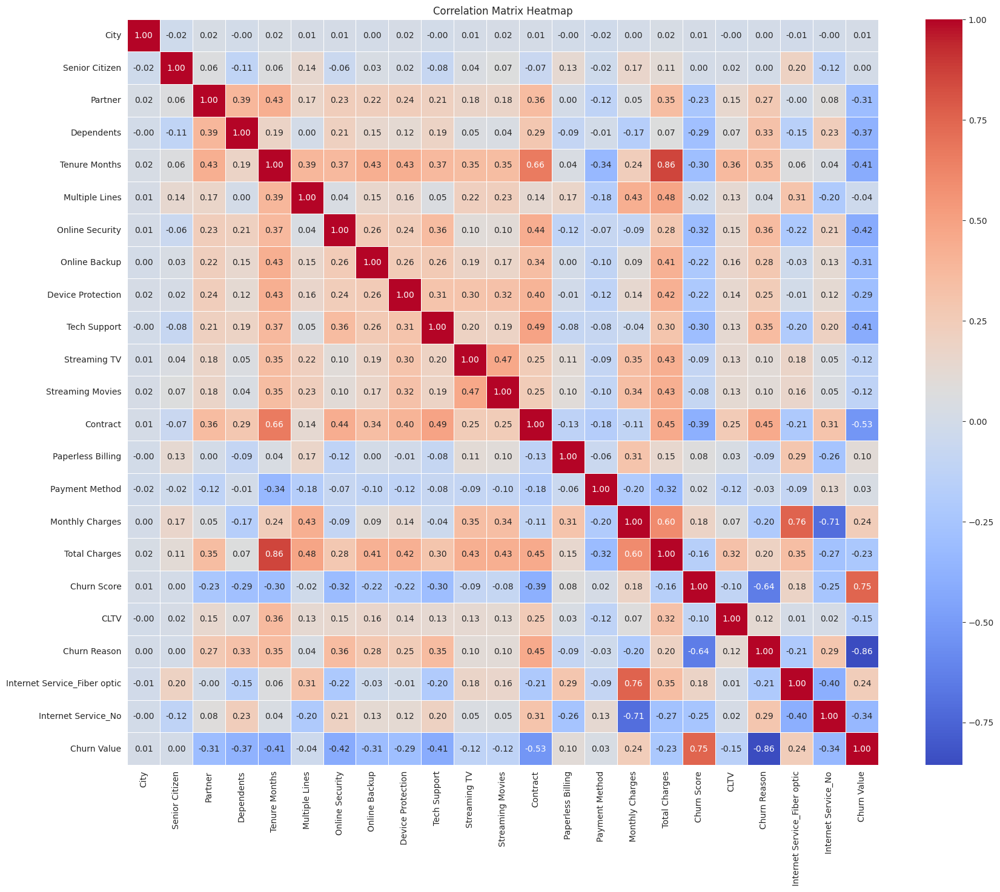

In [ ]:
# Compute the correlation matrix, excluding non-numeric columns
corr_matrix = modified_df_1.corr()

# Plot the heatmap
plt.figure(figsize=(20, 16))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")
plt.show()

In [ ]:
# based on corr payment method , multiple lines,city,senior citizen and Paperless Billing not important for churn value
modified_df_1=modified_df_1.drop(columns=['Payment Method','Multiple Lines','City','Paperless Billing','Senior Citizen'])

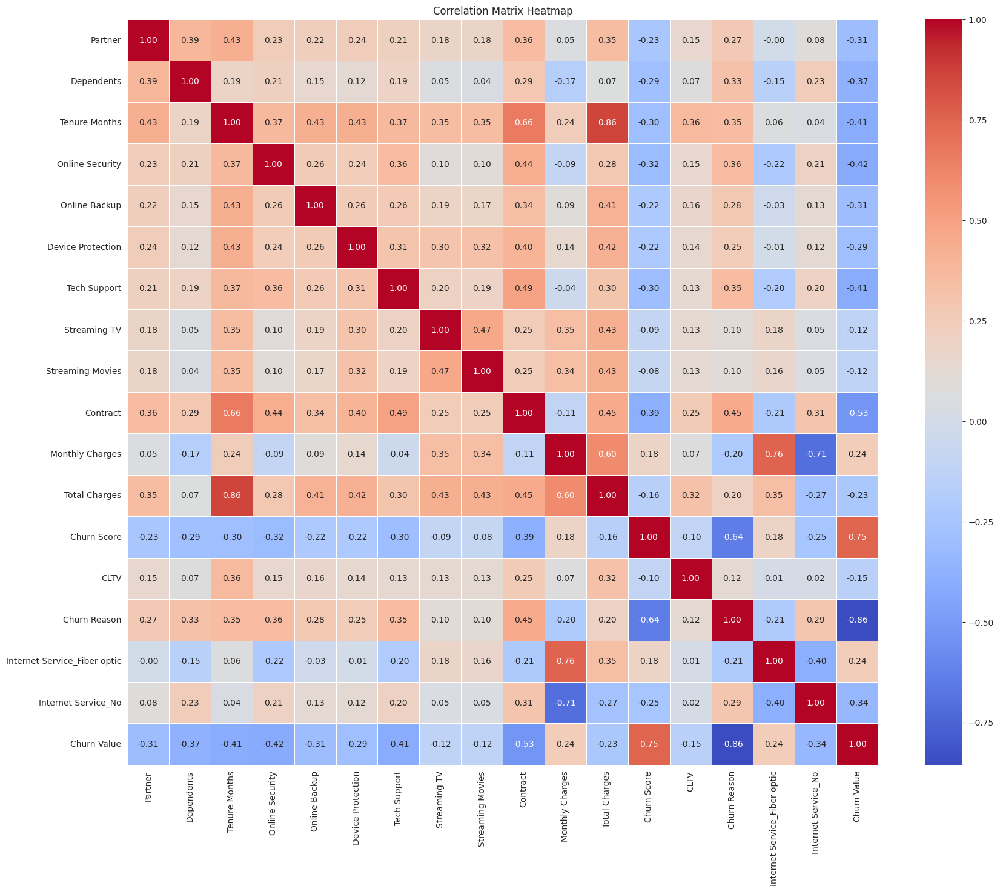

In [ ]:
# Compute the correlation matrix
corr_matrix = modified_df_1.corr()

# Plot the heatmap
plt.figure(figsize=(20, 16))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")
plt.show()

# Create new dataframe

In [ ]:
predict_churn_value_df=modified_df_1.drop(columns=['Churn Score','Churn Reason'])

In [ ]:
predict_churn_value_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10348 entries, 0 to 10347
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Partner                       10348 non-null  int64  
 1   Dependents                    10348 non-null  int64  
 2   Tenure Months                 10348 non-null  int64  
 3   Online Security               10348 non-null  int64  
 4   Online Backup                 10348 non-null  int64  
 5   Device Protection             10348 non-null  int64  
 6   Tech Support                  10348 non-null  int64  
 7   Streaming TV                  10348 non-null  int64  
 8   Streaming Movies              10348 non-null  int64  
 9   Contract                      10348 non-null  int64  
 10  Monthly Charges               10348 non-null  float64
 11  Total Charges                 10348 non-null  float64
 12  CLTV                          10348 non-null  int64  
 13  I

# Predict Churn value modelling

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier



In [ ]:
# train test split
x = predict_churn_value_df.drop('Churn Value',axis=1)
y = predict_churn_value_df['Churn Value']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [ ]:
# define  dictionary of models
models = {
    "Logistic Regression": LogisticRegression(),
    "Support Vector Machine": SVC(),
    "Random Forest": RandomForestClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Naive Bayes": GaussianNB(),
    "Neural Network": MLPClassifier(),
     "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}
# define a dictionary of metrics
results = {
    "Model": [],
    "test_Accuracy": [],
    "train_Accuracy": [],
    "Precision": [],
    "Recall": [],
    "F1 Score": [],
}

In [ ]:
# train each model and evaluate its performance
for model_name, model in models.items():
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    yy_pred=model.predict(x_train)

    # calculate metrics
    test_accuracy = accuracy_score(y_test, y_pred)
    train_accuracy = accuracy_score(y_train, yy_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # store the results
    results["Model"].append(model_name)
    results["test_Accuracy"].append(test_accuracy)
    results["train_Accuracy"].append(train_accuracy)
    results["Precision"].append(precision)
    results["Recall"].append(recall)
    results["F1 Score"].append(f1)

# Convert the results into a DataFrame
results_df = pd.DataFrame(results)

results_df


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:08:52] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


,Model,test_Accuracy,train_Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,0.810628,0.807925,0.795191,0.846445,0.820018
1,Support Vector Machine,0.627536,0.636627,0.620748,0.691943,0.654415
2,Random Forest,0.869082,0.999879,0.874046,0.868246,0.871136
3,Decision Tree,0.808696,1.000000,0.811143,0.814218,0.812677
4,Gradient Boosting,0.840097,0.850205,0.837687,0.851185,0.844382
5,K-Nearest Neighbors,0.713527,0.817589,0.696429,0.776303,0.734200
6,Naive Bayes,0.809179,0.807200,0.786957,0.857820,0.820862
7,Neural Network,0.762319,0.751752,0.692413,0.960190,0.804607
8,XGBoost,0.859903,0.958323,0.863248,0.861611,0.862429


#*Best models*
#1.Random Forest	0.869082 __	0.999879
#2.XGBoost	0.859903  __	0.958323
#3.Gradient Boosting	0.840097  __	0.850205
#4.Logistic Regression	0.810628  __	0.807925
#5.Naive Bayes	0.809179	  __     0.807200
#6.Neural Network	0.766184	__   0.757792

# **Random Forest**

In [ ]:
# parameter space
param_dist = {
    'n_estimators': randint(50, 150),
    'max_depth': [5, 10, 15, None],
    'min_samples_split': randint(4, 15),
    'min_samples_leaf': randint(2, 10),
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False]
}

rf_model = RandomForestClassifier(random_state=42)

random_search = RandomizedSearchCV(
    estimator=rf_model,
    param_distributions=param_dist,
    n_iter=40,
    cv=5,
    n_jobs=-1,
    verbose=2,
    scoring='accuracy',
    random_state=42
)

random_search.fit(x_train, y_train)

# Best model
best_rf = random_search.best_estimator_
best_params = random_search.best_params_
best_score = random_search.best_score_

y_pred_rf = best_rf.predict(x_test)
y_pred_train_rf = best_rf.predict(x_train)

train_acc = accuracy_score(y_train, y_pred_train_rf)
test_acc = accuracy_score(y_test, y_pred_rf)
precision = precision_score(y_test, y_pred_rf)
recall = recall_score(y_test, y_pred_rf)
f1 = f1_score(y_test, y_pred_rf)
roc_auc = roc_auc_score(y_test, best_rf.predict_proba(x_test)[:, 1])

print(" Best Hyperparameters:", best_params)
print("Train Accuracy:", train_acc)
print("Test Accuracy:", test_acc)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("ROC AUC:", roc_auc)



Fitting 5 folds for each of 40 candidates, totalling 200 fits
 Best Hyperparameters: {'bootstrap': True, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 14, 'n_estimators': 108}
Train Accuracy: 0.9097608117902876
Test Accuracy: 0.8603864734299517
Precision: 0.8613207547169811
Recall: 0.8654028436018958
F1 Score: 0.8633569739952719
ROC AUC: 0.9361791142343521


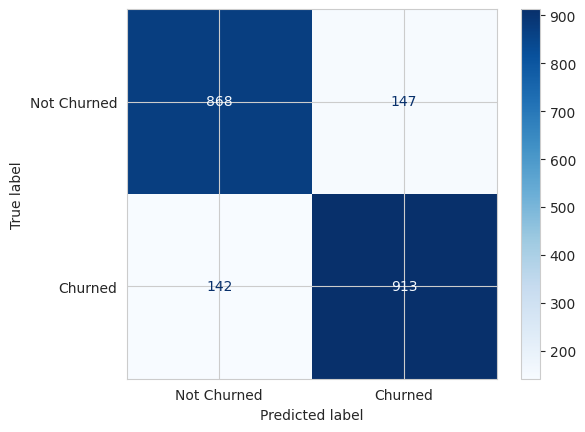

In [ ]:
# Confusion Matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)
disp_rf = ConfusionMatrixDisplay(confusion_matrix=cm_rf, display_labels=["Not Churned", "Churned"])
disp_rf.plot(cmap='Blues')

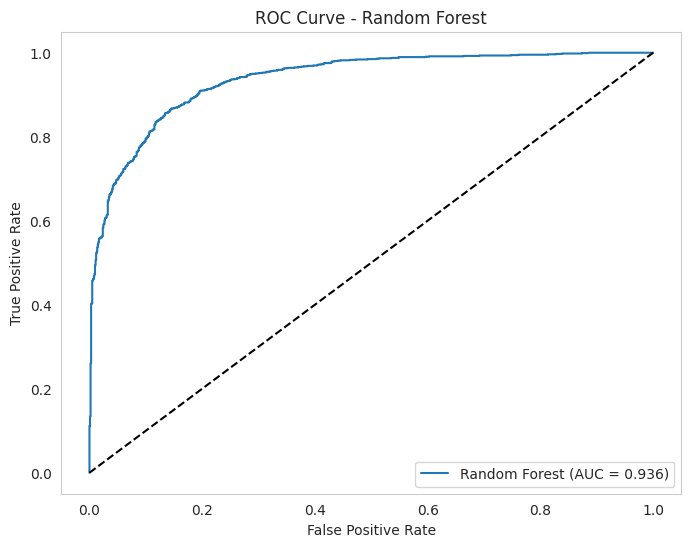

In [ ]:
y_probs_rf = best_rf.predict_proba(x_test)[:, 1]
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, y_probs_rf)
roc_auc_rf = auc(fpr_rf, tpr_rf)


plt.figure(figsize=(8,6))
plt.plot(fpr_rf, tpr_rf, label='Random Forest (AUC = {:.3f})'.format(roc_auc_rf))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest')
plt.legend(loc='lower right')
plt.grid()
plt.show()

#Gradient boosting

In [ ]:
# define hyperparameter space for XGBoost
param_dist = {
    'n_estimators': randint(80, 150),
    'learning_rate': uniform(0.01, 0.1),
    'max_depth': randint(3, 10),
    'min_child_weight': randint(1, 6),
    'gamma': uniform(0, 0.4),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.7, 0.3),
}

# initialize the model
xgb_model = XGBClassifier(
    objective='binary:logistic',
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)

# Random Search
random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist,
    n_iter=40,
    cv=5,
    n_jobs=-1,
    verbose=2,
    scoring='accuracy',
    random_state=42
)

# Fit the Random search
random_search.fit(x_train, y_train)

# Best model and performance
best_params = random_search.best_params_
best_score = random_search.best_score_

print("Best Hyperparameters:", best_params)
print("Best Cross-Validation Accuracy:", best_score)

# Evaluate the best model
best_xgb = random_search.best_estimator_

train_acc = best_xgb.score(x_train, y_train)
test_acc = best_xgb.score(x_test, y_test)

print("Train Accuracy:", train_acc)
print("Test Accuracy:", test_acc)


Fitting 5 folds for each of 40 candidates, totalling 200 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:14:53] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best Hyperparameters: {'colsample_bytree': np.float64(0.7099152198701645), 'gamma': np.float64(0.1380284992106732), 'learning_rate': np.float64(0.07343513447013637), 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 132, 'subsample': np.float64(0.8468358280832688)}
Best Cross-Validation Accuracy: 0.8528618445057431
Train Accuracy: 0.931505194491423
Test Accuracy: 0.8608695652173913


In [ ]:
# Classification metrics
y_pred_xgb = best_xgb.predict(x_test)
precision_xgb = precision_score(y_test, y_pred_xgb)
recall_xgb = recall_score(y_test, y_pred_xgb)
f1_xgb = f1_score(y_test, y_pred_xgb)
roc_auc_xgb = roc_auc_score(y_test, best_xgb.predict_proba(x_test)[:, 1])

print("Precision:", precision_xgb)
print("Recall:", recall_xgb)
print("F1-Score:", f1_xgb)
print("ROC AUC:", roc_auc_xgb)

Precision: 0.8621340887629839
Recall: 0.8654028436018958
F1-Score: 0.8637653736991485
ROC AUC: 0.9393565708682559


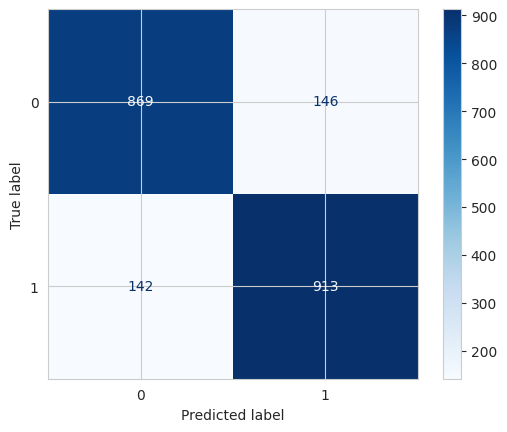

In [ ]:
# Confusion Matrix
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
disp_xgb = ConfusionMatrixDisplay(confusion_matrix=cm_xgb)
disp_xgb.plot(cmap='Blues')

In [ ]:
param_grid = {
    'n_estimators': [125, 130, 135],
    'learning_rate': [0.07, 0.073, 0.075],
    'max_depth': [7, 8],
    'min_child_weight': [1, 2],
    'gamma': [0.13, 0.14],
    'subsample': [0.83, 0.85],
    'colsample_bytree': [0.7, 0.72]
}

xgb_model = XGBClassifier(
    objective='binary:logistic',
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)

grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=5,
    n_jobs=-1,
    scoring='accuracy',
    verbose=2
)

grid_search.fit(x_train, y_train)

# Best result
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(" Best Hyperparameters:", best_params)
print("Best CV Accuracy:", best_score)

best_model = grid_search.best_estimator_

# Evaluation
train_acc = best_model.score(x_train, y_train)
test_acc = best_model.score(x_test, y_test)

print("Train Accuracy:", train_acc)
print("Test Accuracy:", test_acc)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:25:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


 Best Hyperparameters: {'colsample_bytree': 0.7, 'gamma': 0.14, 'learning_rate': 0.073, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 125, 'subsample': 0.83}
Best CV Accuracy: 0.8573324868280865
Train Accuracy: 0.9376661029234115
Test Accuracy: 0.8632850241545894


In [ ]:
tuned_model = XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    random_state=42,
    learning_rate=0.073,
    n_estimators=100,
    max_depth=5,
    min_child_weight=3,
    gamma=0.14,
    subsample=0.83,
    colsample_bytree=0.7
)

tuned_model.fit(x_train, y_train)

y_pred = tuned_model.predict(x_test)

train_acc = tuned_model.score(x_train, y_train)
test_acc = tuned_model.score(x_test, y_test)

print("Train Accuracy:", train_acc)
print("Test Accuracy:", test_acc)

precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, tuned_model.predict_proba(x_test)[:, 1])

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("ROC AUC:", roc_auc)


Train Accuracy: 0.8733993718289442
Test Accuracy: 0.8531400966183574
Precision: 0.8454461821527139
Recall: 0.8710900473933649
F1 Score: 0.8580765639589168
ROC AUC: 0.9350454089136879


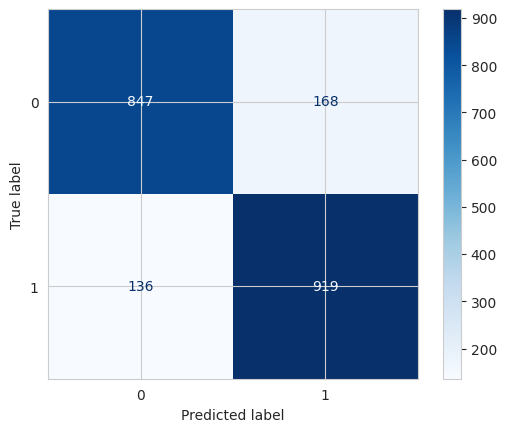

In [ ]:
# Confusion Matrix
cm_xgb_tuned = confusion_matrix(y_test, y_pred)
disp_xgb_tuned = ConfusionMatrixDisplay(confusion_matrix=cm_xgb_tuned)
disp_xgb_tuned.plot(cmap='Blues')

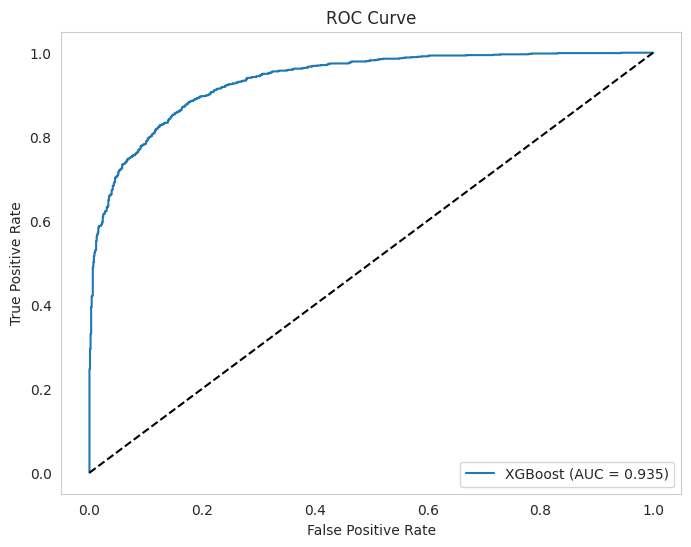

In [ ]:
y_probs = tuned_model.predict_proba(x_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, label='XGBoost (AUC = {:.3f})'.format(roc_auc))
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()


In [ ]:

param_dist = {
    'n_estimators': randint(80, 150),
    'learning_rate': uniform(0.01, 0.1),
    'max_depth': randint(2, 6),
    'min_samples_split': randint(4, 10),
    'min_samples_leaf': randint(2, 6),
    'subsample': uniform(0.8, 0.15),
}

gb_model = GradientBoostingClassifier(random_state=42)

random_search = RandomizedSearchCV(
    estimator=gb_model,
    param_distributions=param_dist,
    n_iter=40,
    cv=5,
    n_jobs=-1,
    verbose=2,
    scoring='accuracy',
    random_state=42
)

random_search.fit(x_train, y_train)

best_params = random_search.best_params_
best_score = random_search.best_score_

print("Best Hyperparameters:", best_params)
print("Best Cross-Validation Accuracy:", best_score)

best_model = random_search.best_estimator_
train_acc = best_model.score(x_train, y_train)
test_acc = best_model.score(x_test, y_test)

print("Train Accuracy:", train_acc)
print("Test Accuracy:", test_acc)


Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Hyperparameters: {'learning_rate': np.float64(0.10717820827209606), 'max_depth': 5, 'min_samples_leaf': 5, 'min_samples_split': 9, 'n_estimators': 118, 'subsample': np.float64(0.8745872758838579)}
Best Cross-Validation Accuracy: 0.8487565859567697
Train Accuracy: 0.9101232181686397
Test Accuracy: 0.8545893719806763


In [ ]:
best_gb = random_search.best_estimator_
y_pred_gb = best_gb.predict(x_test)
precision_gb = precision_score(y_test, y_pred_gb)
recall_gb = recall_score(y_test, y_pred_gb)
f1_gb = f1_score(y_test, y_pred_gb)
roc_auc_gb = roc_auc_score(y_test, best_gb.predict_proba(x_test)[:, 1])

print("Precision:", precision_gb)
print("Recall:", recall_gb)
print("F1-Score:", f1_gb)
print("ROC AUC:", roc_auc_gb)

Precision: 0.8523364485981308
Recall: 0.8644549763033176
F1-Score: 0.8583529411764705
ROC AUC: 0.9355599654472018


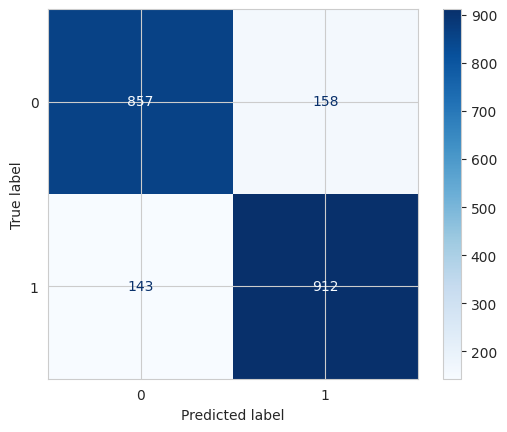

In [ ]:
# Confusion Matrix
cm_gb = confusion_matrix(y_test, y_pred_gb)
disp_gb = ConfusionMatrixDisplay(confusion_matrix=cm_gb)
disp_gb.plot(cmap='Blues')

# Logistic Regression

In [ ]:
param_dist_lr = {
    'C': uniform(0.01, 10),
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

lr_model = LogisticRegression(random_state=42, max_iter=1000)

random_search_lr = RandomizedSearchCV(
    estimator=lr_model,
    param_distributions=param_dist_lr,
    n_iter=30,
    cv=5,
    n_jobs=-1,
    verbose=2,
    scoring='accuracy',
    random_state=42
)

random_search_lr.fit(x_train, y_train)

best_lr = random_search_lr.best_estimator_
train_acc = best_lr.score(x_train, y_train)
test_acc = best_lr.score(x_test, y_test)

print("Best Parameters for Logistic Regression:", random_search_lr.best_params_)
print("Best Cross Validation Accuracy:", random_search_lr.best_score_)
print("Train Accuracy:", train_acc)
print("Test Accuracy:", test_acc)


Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best Parameters for Logistic Regression: {'C': np.float64(0.46227288910538067), 'penalty': 'l2', 'solver': 'liblinear'}
Best Cross Validation Accuracy: 0.8162594684530846
Train Accuracy: 0.8162599661754046
Test Accuracy: 0.8231884057971014


In [ ]:
y_pred_lr = best_lr.predict(x_test)
precision_lr = precision_score(y_test, y_pred_lr)
recall_lr = recall_score(y_test, y_pred_lr)
f1_lr = f1_score(y_test, y_pred_lr)
roc_auc_lr = roc_auc_score(y_test, best_lr.predict_proba(x_test)[:, 1])
print("Precision:", precision_lr)
print("Recall:", recall_lr)
print("F1-Score:", f1_lr)
print("ROC AUC:", roc_auc_lr)

Precision: 0.8062222222222222
Recall: 0.8597156398104265
F1-Score: 0.8321100917431192
ROC AUC: 0.8949594938482011


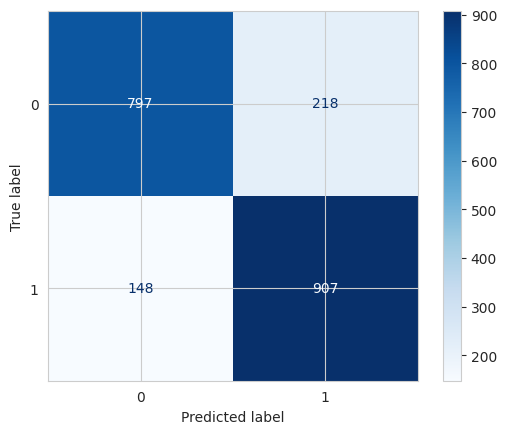

In [ ]:
cm_lr = confusion_matrix(y_test, y_pred_lr)
disp_lr = ConfusionMatrixDisplay(confusion_matrix=cm_lr)
disp_lr.plot(cmap='Blues')


#Naive Bayes

In [ ]:

param_grid_nb = {
    'var_smoothing': [1e-10, 1e-9, 1e-8, 1e-7]
}

nb_model = GaussianNB()

grid_search_nb = GridSearchCV(
    estimator=nb_model,
    param_grid=param_grid_nb,
    cv=5,
    n_jobs=-1,
    verbose=2,
    scoring='accuracy'
)

grid_search_nb.fit(x_train, y_train)

best_nb = grid_search_nb.best_estimator_
train_acc = best_nb.score(x_train, y_train)
test_acc = best_nb.score(x_test, y_test)

print("Best Parameters - Naive Bayes:", grid_search_nb.best_params_)
print("Best Cross-Validation Accuracy:", grid_search_nb.best_score_)
print("Train Accuracy:", train_acc)
print("Test Accuracy:", test_acc)


Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best Parameters - Naive Bayes: {'var_smoothing': 1e-10}
Best Cross-Validation Accuracy: 0.8078055810966621
Train Accuracy: 0.8069582024643633
Test Accuracy: 0.808695652173913


In [ ]:
y_pred_nb = best_nb.predict(x_test)
precision_nb = precision_score(y_test, y_pred_nb)
recall_nb = recall_score(y_test, y_pred_nb)
f1_nb = f1_score(y_test, y_pred_nb)
roc_auc_nb = roc_auc_score(y_test, best_nb.predict_proba(x_test)[:, 1])

print("Precision:", precision_nb)
print("Recall:", recall_nb)
print("F1-Score:", f1_nb)
print("ROC AUC:", roc_auc_nb)

Precision: 0.7862728062554301
Recall: 0.8578199052132701
F1-Score: 0.8204895738893926
ROC AUC: 0.8736693670767866


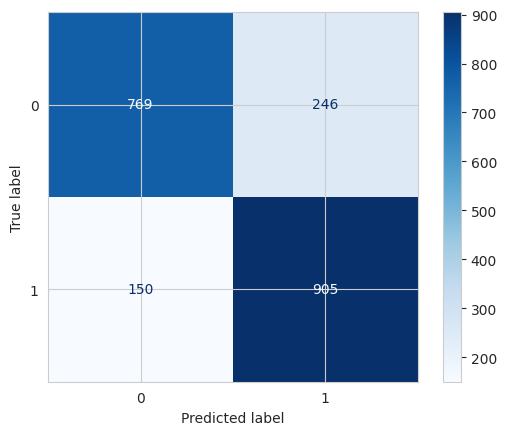

In [ ]:
cm_nb = confusion_matrix(y_test, y_pred_nb)
disp_nb = ConfusionMatrixDisplay(confusion_matrix=cm_nb)
disp_nb.plot(cmap='Blues')


# Neural network

In [ ]:
param_dist_nn = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50), (50, 50)],
    'activation': ['tanh', 'relu'],
    'solver': ['adam', 'sgd'],
    'alpha': uniform(0.0001, 0.01),
    'learning_rate': ['constant', 'adaptive']
}

nn_model = MLPClassifier(max_iter=1000, random_state=42)

random_search_nn = RandomizedSearchCV(
    estimator=nn_model,
    param_distributions=param_dist_nn,
    n_iter=100,
    cv=5,
    n_jobs=-1,
    verbose=2,
    scoring='accuracy',
    random_state=42
)

random_search_nn.fit(x_train, y_train)

best_nn = random_search_nn.best_estimator_
train_acc = best_nn.score(x_train, y_train)
test_acc = best_nn.score(x_test, y_test)

print("Best Parameters - Neural Network:", random_search_nn.best_params_)
print("Best Cross-Validation Accuracy:", random_search_nn.best_score_)
print("Train Accuracy:", train_acc)
print("Test Accuracy:", test_acc)


Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best Parameters - Neural Network: {'activation': 'tanh', 'alpha': np.float64(0.002821322493846353), 'hidden_layer_sizes': (100, 50), 'learning_rate': 'adaptive', 'solver': 'adam'}
Best Cross-Validation Accuracy: 0.7789355926266475
Train Accuracy: 0.8026093259241363
Test Accuracy: 0.797584541062802


In [ ]:
y_pred_nn = best_nn.predict(x_test)
precision_nn = precision_score(y_test, y_pred_nn)
recall_nn = recall_score(y_test, y_pred_nn)
f1_nn = f1_score(y_test, y_pred_nn)
roc_auc_nn = roc_auc_score(y_test, best_nn.predict_proba(x_test)[:, 1])
print("Precision:", precision_nn)
print("Recall:", recall_nn)
print("F1-Score:", f1_nn)
print("ROC AUC:", roc_auc_nn)


Precision: 0.812992125984252
Recall: 0.7829383886255924
F1-Score: 0.797682279092226
ROC AUC: 0.8603170452688347


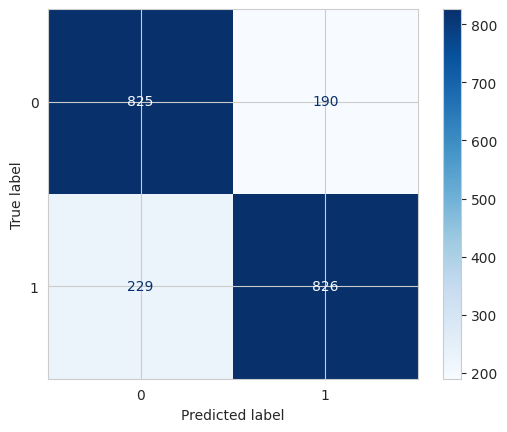

In [ ]:
cm_nn = confusion_matrix(y_test, y_pred_nn)
disp_nn = ConfusionMatrixDisplay(confusion_matrix=cm_nn)
disp_nn.plot(cmap='Blues')
